# obtaining normalized backgrounds from seo images

In [1]:
import numpy as np
import sep
import matplotlib.pyplot as plt
# from astropy.io import fits
import fitsio
import os
import pandas as pd
import astropy
import scipy

In [2]:
datapath = '/Users/avery/seoproject/data2w/'
fpath = '/Users/avery/seoproject/filenames.csv'

In [3]:
fnames = pd.read_csv(fpath)
fn = fnames['filename']

### normalizing images

In [4]:
expts = []

for f in fn:
    h = fitsio.read_header(datapath+f)
    et = h['EXPTIME']
    expts.append(et)

In [4]:
nimgs = []
# maximums = {}
# datamax = []
# ndatamax = []
for i in range(0,len(fn)):
    data = fitsio.read(datapath+fn[i])
    data = data / np.median(data)
    nimgs.append(data)
    
#     d2 = data / expts[i]
#     if np.max(data)<= np.max(d2):
#         print('issues at {}-th index'.format(i))
#     datamax.append(np.max(data))
#     ndatamax.append(np.max(d2))
    
# maximums['filename']=fn
# maximums['data max']=datamax
# maximums['exp time']=expts
# maximums['norm data max']=ndatamax
#     print(np.max(data), np.max(expts[i]), np.max(d2))
#     nimgs.append(d2)

In [8]:
df = pd.DataFrame.from_dict(maximums)

In [10]:
df.to_csv('/Users/avery/seoproject/maximums.csv')

In [12]:
savepath = '/Users/avery/seoproject'
np.save(savepath+'norm_imgs', nimgs)

### applying sep to the images & computing global medians

In [5]:
%%time

mimgs = []
meds = []
segmaps = []
dsb = []
vs = []
objs = []

for d in range(0,len(fn)):
    data = nimgs[d]
    bkg = sep.Background(data)
    data_sub = data - bkg
    dsb.append(data_sub)
    
    v = np.var(data_sub)
    vs.append(v)
    th = 0.75
    
    objects, segmap = sep.extract(data_sub, thresh=th, var=v, segmentation_map=True)
    segmaps.append(segmap)
    objs.append(objects)
    
    if len(objects)==0:
        print('no sources {}-th index'.format(d))
    
    mimg = np.zeros_like(data)
    mimg[segmap<1]=data[segmap<1]
    mimgs.append(mimg)
    
    med = np.median(mimg)
    meds.append(med)
    
    

CPU times: user 1min 37s, sys: 18.5 s, total: 1min 56s
Wall time: 2min 7s


In [24]:
savepath = '/Users/avery/seoproject'
np.save(savepath+'/masked_imgs', mimgs)
np.save(savepath+'/img_meds', meds)
np.save(savepath+'/sub_imgs', dsb)
np.save(savepath+'/img_vars', vs)
np.save(savepath+'/segmaps', segmaps)

In [22]:
savepath = '/Users/avery/seoproject'

In [9]:
from matplotlib.patches import Ellipse

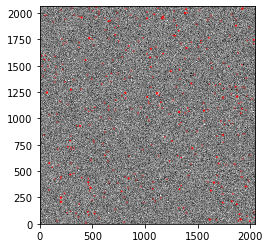

In [14]:
# plot background-subtracted image
fig, ax = plt.subplots()
m, s = np.mean(data_sub), np.std(data_sub)
im = ax.imshow(data_sub, interpolation='nearest', cmap='gray',
               vmin=m-s, vmax=m+s, origin='lower')

# plot an ellipse for each object
for i in range(len(objects)):
    e = Ellipse(xy=(objects['x'][i], objects['y'][i]),
                width=6*objects['a'][i],
                height=6*objects['b'][i],
                angle=objects['theta'][i] * 180. / np.pi)
    e.set_facecolor('none')
    e.set_edgecolor('red')
    ax.add_artist(e)
    
# plt.savefig('sepimage.png')

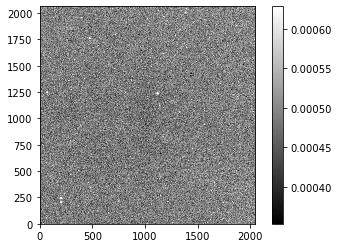

In [13]:
m, s = np.mean(data), np.std(data)
plt.imshow(data, interpolation='nearest', cmap='gray', vmin=m-s, vmax=m+s, origin='lower')
plt.colorbar();

# plt.savefig('ogimage.png')

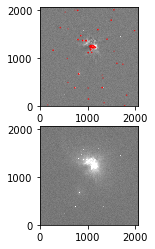

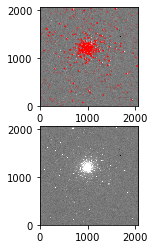

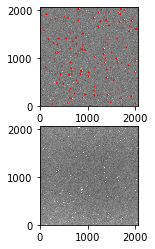

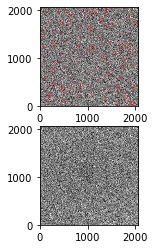

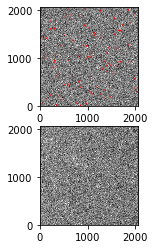

In [19]:
for k in range(0,5):
    ix = np.random.randint(0,319)
    
    data_sub = dsb[ix]
    objects = objs[ix]
    data = nimgs[ix]
    
    
    
    # plot background-subtracted image
    fig, axs = plt.subplots(2)
    m, s = np.mean(data_sub), np.std(data_sub)
    im = axs[0].imshow(data_sub, interpolation='nearest', cmap='gray',
                   vmin=m-s, vmax=m+s, origin='lower')

    # plot an ellipse for each object
    for i in range(len(objects)):
        e = Ellipse(xy=(objects['x'][i], objects['y'][i]),
                    width=6*objects['a'][i],
                    height=6*objects['b'][i],
                    angle=objects['theta'][i] * 180. / np.pi)
        e.set_facecolor('none')
        e.set_edgecolor('red')
        axs[0].add_artist(e)
        
    m, s = np.mean(data), np.std(data)
    axs[1].imshow(data, interpolation='nearest', cmap='gray', vmin=m-s, vmax=m+s, origin='lower')
#     plt.colorbar();
        
    

### creating median stacked images

In [38]:
dates = []
filters = []
for i in range(0,len(fn)):
    h = fitsio.read_header(datapath+fn[i])
    date = h['DATE-OBS'].split('T')[0]
    dates.append(date)
    ft = h['FILTER']
    filters.append(ft)


In [48]:
uq, ix = np.unique(dates, return_inverse=True)
fuq, fix, cts = np.unique(filters, return_inverse=True, return_counts=True)

In [8]:
mkimgs = np.asarray(mimgs)

In [44]:
fuq

array(['[OIII]', '[SII]', 'clear', 'g-band', 'h-alpha', 'i-band',
       'r-band'], dtype='<U7')

In [49]:
cts

array([  1,   2,   6,  71,   3,  83, 153])

In [59]:
np.where(fix==1)[0]

array([  9, 120])

In [105]:
d = uq[4]
ind = np.where(ix==i)[0]
ftvl = fix[np.where(ix==i)[0]]
allpn = mkimgs[ind]
fin = np.where(ftvl==2)[0]
print(fin)
apfpn = allpn[ftvl]

[]


IndexError: index 6 is out of bounds for axis 0 with size 2

In [80]:
fin

0

In [86]:
allpn.shape[0]

1

In [121]:
nights[uq[0]]['g-band'].shape

(9, 2064, 2048)

In [134]:
%%time
nights = {}
# organizing the images per filter per night
for i in range(0,len(uq)):
    flt = {}
    d = uq[i]
    ind = np.where(ix==i)[0]
    ftvl = fix[np.where(ix==i)[0]]
    allpn = mkimgs[ind]
#     print(i)
#     print(allpn.shape)
    flt['all']=allpn
    for t in range(0,len(fuq)):
        fin = np.where(ftvl==t)[0]
#         print(t, fin)
        if allpn.shape[0]>1:
#             print(fin)
            apfpn = allpn[fin]
#             print('success')
            flt[fuq[t]]=apfpn
        if allpn.shape[0]==1 and len(fin)!=0:
            flt[fuq[t]]=allpn
        if allpn.shape[0]==1 and len(fin)==0:
            flt[fuq[t]] = []
#     print(ind.shape, allpn.shape)
    nights[uq[i]] = flt
    

CPU times: user 5.77 s, sys: 14.1 s, total: 19.8 s
Wall time: 31.1 s


In [127]:
nights[uq[0]]

{'all': array([[[1.0308056 , 1.0645157 , 1.0410057 , ..., 1.0298034 ,
          0.9742714 , 0.9015303 ],
         [1.0540198 , 1.0285815 , 0.9669988 , ..., 0.9327862 ,
          0.93120426, 1.0202361 ],
         [1.0052305 , 0.94471586, 0.9212651 , ..., 1.0206339 ,
          0.8811656 , 0.85949653],
         ...,
         [1.140341  , 0.9713017 , 1.0574055 , ..., 1.0520605 ,
          1.0121375 , 1.0583376 ],
         [1.1152785 , 1.0950173 , 1.0184492 , ..., 0.9195427 ,
          1.01849   , 0.9272817 ],
         [0.89948785, 0.9702669 , 1.0806717 , ..., 0.96095806,
          0.8537305 , 1.0279194 ]],
 
        [[0.9677583 , 1.0507957 , 0.91309917, ..., 0.9690817 ,
          0.87314165, 1.0370662 ],
         [0.98252004, 1.0813965 , 0.9376137 , ..., 0.96078235,
          0.984713  , 0.997815  ],
         [0.99193245, 1.0274055 , 0.9754146 , ..., 0.981563  ,
          1.0683767 , 0.9723825 ],
         ...,
         [1.0961943 , 1.1184778 , 0.9341656 , ..., 0.9806619 ,
          0.96908

In [99]:
fuq[1]='SII'

In [10]:
import astropy.stats

In [135]:
for i in range(0,len(uq)):
    if nights[uq[i]]['all'].shape[0]==1:
        print(nights[uq[i]])

{'all': array([[[0.        , 0.        , 0.        , ..., 1.021104  ,
         0.99127156, 0.9803804 ],
        [0.        , 0.        , 0.        , ..., 1.0369576 ,
         0.99014175, 0.9733405 ],
        [0.        , 0.        , 0.        , ..., 0.9954786 ,
         1.0157349 , 1.0141413 ],
        ...,
        [1.0491731 , 1.07981   , 1.1347522 , ..., 0.8984181 ,
         0.9108467 , 0.8787963 ],
        [1.0945686 , 1.1050879 , 1.1259989 , ..., 0.87633204,
         0.8906208 , 0.9234849 ],
        [1.071726  , 1.1231539 , 1.1036236 , ..., 0.93467736,
         0.9292416 , 0.8848679 ]]], dtype=float32), 'OIII': [], 'SII': [], 'clear': array([[[0.        , 0.        , 0.        , ..., 1.021104  ,
         0.99127156, 0.9803804 ],
        [0.        , 0.        , 0.        , ..., 1.0369576 ,
         0.99014175, 0.9733405 ],
        [0.        , 0.        , 0.        , ..., 0.9954786 ,
         1.0157349 , 1.0141413 ],
        ...,
        [1.0491731 , 1.07981   , 1.1347522 , ..., 0.

In [150]:
%%time
mkmedimgs = {}
# mkmnimgs = {}
# mkstdimgs = {}
# iwmed = []
for i in range(0,len(uq)):
    fr = {}
    for j in range(0,len(fuq)):
#     nt = np.ma.masked_equal(nights[uq[i]],0)
#     print(nt.shape)
#     mds = np.ma.median(nt, axis=0)
        if nights[uq[i]]['all'].shape[0]>1 and nights[uq[0]][fuq[j]].shape[0]!=0:
#             iwmed.append(i)
            mn, md, std = astropy.stats.sigma_clipped_stats(nights[uq[i]][fuq[j]], axis=0, mask_value=0.0)
            fr[fuq[j]]=md
#             mkmedimgs.append(md)
#             mkmnimgs.append(mn)
#             mkstdimgs.append(std)
        if nights[uq[i]]['all'].shape[0]==1 and nights[uq[0]][fuq[j]].shape[0]!=0:
            fr[fuq[j]]=nights[uq[i]]['all']
        elif nights[uq[0]][fuq[j]].shape[0]==0:
            fr[fuq[j]]=[]

    mkmedimgs[uq[i]]=fr

CPU times: user 3min 11s, sys: 1min 8s, total: 4min 20s
Wall time: 4min 43s


In [151]:
mkmedimgs

{'2023-03-03': {'OIII': [],
  'SII': [],
  'clear': [],
  'g-band': array([[0.99520016, 1.02155447, 0.97489959, ..., 0.9871372 , 0.97190732,
          0.99676168],
         [1.01674819, 1.00328314, 0.96792501, ..., 0.98837197, 1.00282574,
          0.99781501],
         [0.99193245, 1.0274055 , 1.02714205, ..., 0.97632474, 1.0241133 ,
          0.99507594],
         ...,
         [1.03877455, 1.05990756, 1.0214231 , ..., 1.02760923, 0.98701108,
          1.00437236],
         [0.99830738, 0.96053514, 1.02518135, ..., 0.98282254, 1.01834059,
          0.98787355],
         [1.01399612, 1.04100817, 1.06344402, ..., 0.97531444, 1.00797307,
          0.97925508]]),
  'h-alpha': [],
  'i-band': array([[1.02990079, 0.92992324, 0.9736768 , ..., 1.00893819, 0.88070035,
          0.95550799],
         [1.03597665, 1.0285815 , 0.97077167, ..., 0.97025764, 0.98926061,
          0.97904587],
         [0.95421088, 0.98007202, 0.94460577, ..., 0.98561931, 0.98206991,
          0.94355607],
         

In [25]:
m, s = np.mean(medimgs[0]), np.std(medimgs[0])
plt.imshow(medimgs[0], origin='lower', vmax=m+s, vmin=m-s, cmap='gray')
plt.title('vmax, vmin = mean ± 1 std')
plt.colorbar()
# plt.savefig('/Users/avery/seoproject/std1_230303.png')

NameError: name 'medimgs' is not defined

In [24]:
m, s = np.mean(medimgs[0]), np.std(medimgs[0])
plt.imshow(medimgs[0], origin='lower', cmap='gray')
plt.title('vmax, vmin = mean ± 1 std')
plt.colorbar()
# plt.savefig('/Users/avery/seoproject/std1_230303.png')

NameError: name 'medimgs' is not defined

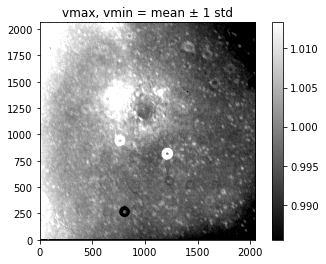

In [12]:
m, s = np.nanmean(mkmedimgs[0]), np.nanstd(mkmedimgs[0])
plt.imshow(mkmedimgs[0], origin='lower', vmax=m+s, vmin=m-s, cmap='gray')
plt.title('vmax, vmin = mean ± 1 std')
plt.colorbar()
plt.savefig('/Users/avery/seoproject/mkstd1_230303.png')

In [ ]:
sep.extract

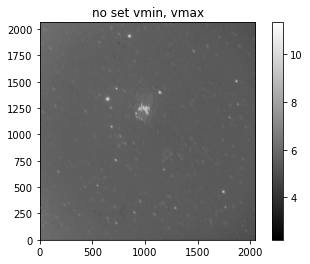

In [113]:
m, s = np.mean(data), np.std(data)
plt.imshow(mkmedimgs[0], origin='lower', cmap='gray')
plt.title('no set vmin, vmax')
plt.colorbar()
plt.savefig('/Users/avery/seoproject/mknovm_230303.png')

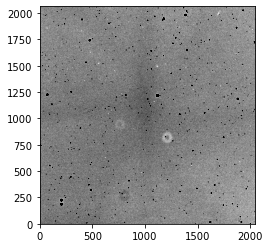

In [57]:
m, s = np.mean(mkimgs[0]), np.std(mkimgs[0])
plt.imshow(mkimgs[0], origin='lower', vmax=m+s, vmin=m-s, cmap='gray')

### dilating image segments

In [13]:
from scipy import ndimage

In [27]:
nimgs = []
for i in range(0,len(fn)):
    data = fitsio.read(datapath+fn[i])
    d2 = data / expts[i]
    if np.max(data)<= np.max(d2):
        print('issues at {}-th index'.format(i))
        
    print('og data max = {0} exp time = {1} norm max = {2}'.format(np.max(data), np.max(expts[i]), np.max(d2)))
#     nimgs.append(d2)

og data max = 3.01120924949646 exp time = 60 norm max = 0.050186820328235626
og data max = 0.6355378031730652 exp time = 8 norm max = 0.07944222539663315
og data max = 6.604151248931885 exp time = 180 norm max = 0.03668972849845886
og data max = 6.614459037780762 exp time = 180 norm max = 0.03674699366092682
og data max = 33750.84765625 exp time = 30 norm max = 1125.0281982421875
og data max = 1.592934012413025 exp time = 30 norm max = 0.05309779942035675
og data max = 0.8092877864837646 exp time = 16 norm max = 0.05058048665523529
og data max = 65290.9609375 exp time = 128 norm max = 510.08563232421875
og data max = 65054.77734375 exp time = 90 norm max = 722.8308715820312
og data max = 5.258607864379883 exp time = 128 norm max = 0.041082873940467834
og data max = 65043.8828125 exp time = 60 norm max = 1084.064697265625
og data max = 64688.67578125 exp time = 60 norm max = 1078.1446533203125
og data max = 1.4680945873260498 exp time = 30 norm max = 0.04893648624420166
og data max = 65

og data max = 3.042949676513672 exp time = 60 norm max = 0.05071582645177841
og data max = 6.525671482086182 exp time = 16 norm max = 0.40785446763038635
og data max = 1.3172543048858643 exp time = 16 norm max = 0.08232839405536652
og data max = 65074.58984375 exp time = 90 norm max = 723.051025390625
og data max = 6.525671482086182 exp time = 16 norm max = 0.40785446763038635
og data max = 0.7967551350593567 exp time = 16 norm max = 0.04979719594120979
og data max = 65979.3984375 exp time = 2 norm max = 32989.69921875
og data max = 31277.056640625 exp time = 128 norm max = 244.3520050048828
og data max = 5.308196067810059 exp time = 128 norm max = 0.04147028177976608
og data max = 0.9978474974632263 exp time = 20 norm max = 0.0498923733830452
og data max = 37822.234375 exp time = 128 norm max = 295.4862060546875
og data max = 42241.5234375 exp time = 128 norm max = 330.01190185546875
og data max = 64759.2421875 exp time = 60 norm max = 1079.3206787109375
og data max = 1.85641467571258

og data max = 23139.13671875 exp time = 128 norm max = 180.77450561523438
og data max = 6.08230447769165 exp time = 10 norm max = 0.608230471611023
og data max = 6.588565349578857 exp time = 300 norm max = 0.021961884573101997
og data max = 35304.703125 exp time = 128 norm max = 275.8179931640625
og data max = 1.3355910778045654 exp time = 30 norm max = 0.04451970383524895
og data max = 0.7933577299118042 exp time = 16 norm max = 0.04958485811948776
og data max = 6.406332015991211 exp time = 16 norm max = 0.4003957509994507
og data max = 27492.9453125 exp time = 90 norm max = 305.4771728515625
og data max = 6.48598575592041 exp time = 16 norm max = 0.40537410974502563
og data max = 65009.75390625 exp time = 60 norm max = 1083.495849609375
og data max = 0.9969304800033569 exp time = 20 norm max = 0.04984652251005173
og data max = 2.6311254501342773 exp time = 60 norm max = 0.04385209083557129
og data max = 3.305772066116333 exp time = 60 norm max = 0.05509620159864426
og data max = 6.63

In [14]:
%%time

mimgs = []
meds = []
segmaps = []
dsb = []
vs = []
objs = []

for d in range(0,len(fn)):
#     data = fitsio.read(datapath+fn[d])
    data = nimgs[d]
    bkg = sep.Background(data)
    data_sub = data - bkg
#     data_sub = data_sub / expts[d]
#     dsb.append(data_sub)
    
    v = np.var(data_sub)
#     vs.append(v)
    th = 0.2
    
    objects, segmap = sep.extract(data_sub, thresh=th, var=v, segmentation_map=True)
    segmap = scipy.ndimage.binary_dilation(segmap, iterations=5) # default # of iters = 1
    segmaps.append(segmap)
#     objs.append(objects)
    
    if len(objects)==0:
        print('no sources {}-th index'.format(d))
    
    mimg = np.zeros_like(data)
    mimg[segmap<1]=data[segmap<1]
    mimgs.append(mimg)
    
    med = np.median(data[segmap<1])
    meds.append(med)
    
mkimgs = np.asarray(mimgs)
# segmaps = np.asarray(segmaps)
# datamax = np.asarray(datamax)
# ndatamax = np.asarray(ndatamax)
# expts = np.asarray(expts)

CPU times: user 16min 26s, sys: 57.7 s, total: 17min 23s
Wall time: 18min 28s


In [26]:
df2 = pd.DataFrame.from_dict(dnights, orient='index')

In [28]:
df2.to_excel('/Users/avery/seoproject/maxvalpnight.xlsx')

In [27]:
for i in range(0,len(mkimgs)):
    if np.all(mkimgs[0][np.where(segmaps[0]==True)])==True:
        print('nonzero at source at {}-th index'.format(i))

In [11]:
from astropy import stats

In [16]:
%%time

mkmedimgs = []
mkmnimgs = []
mkstdimgs = []
iwmed = []
for i in range(0,len(uq)):
#     if nights[uq[i]].shape[0]>1:
#         nt = np.ma.masked_equal(nights[uq[i]],0.0)
# #         print(nt.shape)
#         mds = np.ma.median(nt, axis=0)
#         mkmedimgs.append(mds)
    if nights[uq[i]].shape[0]>1:
        iwmed.append(i)
        mn, md, std = astropy.stats.sigma_clipped_stats(nights[uq[i]], axis=0, mask_value=0.0)
        mkmedimgs.append(md)
        mkmnimgs.append(mn)
        mkstdimgs.append(std)

/Users/avery/miniforge3/envs/a211env/lib/python3.8/site-packages/astropy/stats/sigma_clipping.py:957: RuntimeWarning: Mean of empty slice
  mean = np.nanmean(data_clipped, axis=axis)
/Users/avery/miniforge3/envs/a211env/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1218: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/Users/avery/miniforge3/envs/a211env/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


CPU times: user 3min 22s, sys: 1min 18s, total: 4min 40s
Wall time: 5min 3s


In [26]:
len(mkmedimgs)

12

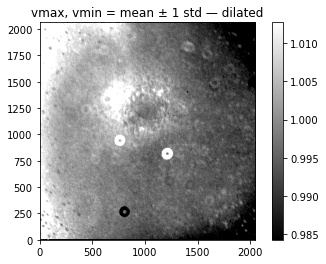

In [17]:
m, s = np.nanmean(mkmedimgs[0]), np.nanstd(mkmedimgs[0])
plt.imshow(mkmedimgs[0], origin='lower', vmax=m+s, vmin=m-s, cmap='gray')
plt.title('vmax, vmin = mean ± 1 std — dilated')
plt.colorbar()
# plt.savefig('/Users/avery/seoproject/mk10iter_230303.png')

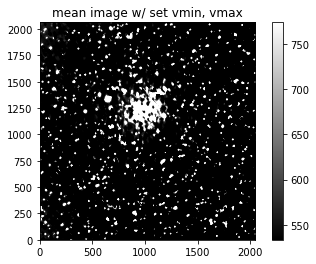

In [13]:
m, s = np.nanmean(mkmnimgs[0]), np.nanstd(mkmnimgs[0])
plt.imshow(mkmedimgs[0], origin='lower', vmax=m+s, vmin=m-s, cmap='gray')
plt.title('mean image w/ set vmin, vmax')
plt.colorbar()
# plt.savefig('/Users/avery/seoproject/mk10iter_230303.png')

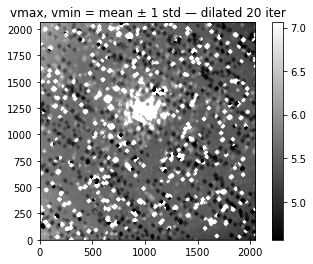

In [39]:
m, s = np.nanmean(mkmedimgs[0]), np.nanstd(mkmedimgs[0])
plt.imshow(mkmedimgs[0], origin='lower', vmax=m+s, vmin=m-s, cmap='gray')
plt.title('vmax, vmin = mean ± 1 std — dilated 20 iter')
plt.colorbar()
# plt.savefig('/Users/avery/seoproject/mk10iter_230303.png')

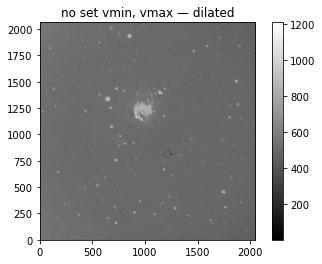

In [26]:
m, s = np.mean(data), np.std(data)
plt.imshow(mkmedimgs[0], origin='lower', cmap='gray')
plt.title('no set vmin, vmax — dilated')
plt.colorbar()
# plt.savefig('/Users/avery/seoproject/mknovm_230303.png')

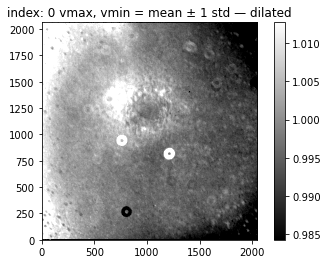

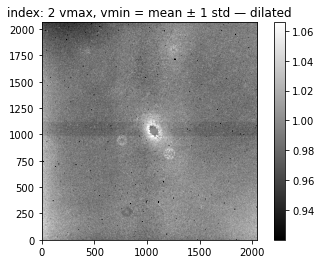

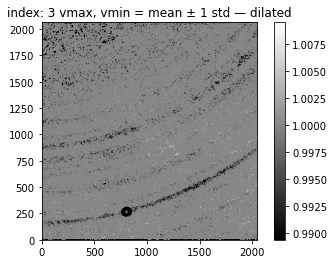

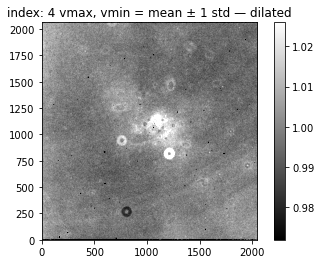

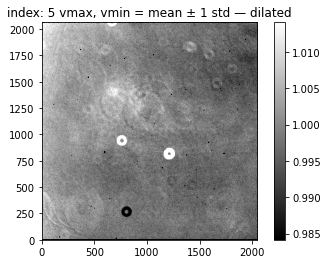

...

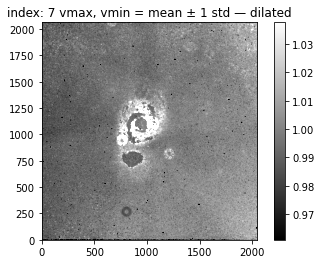

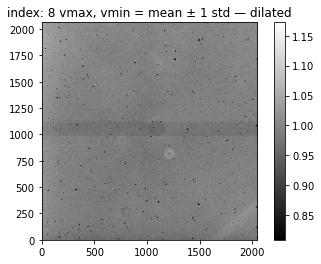

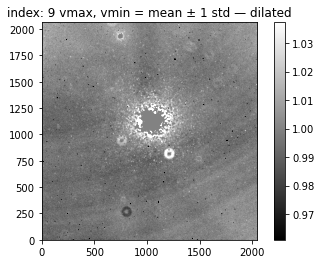

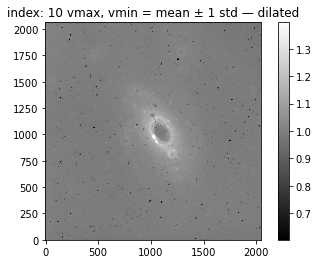

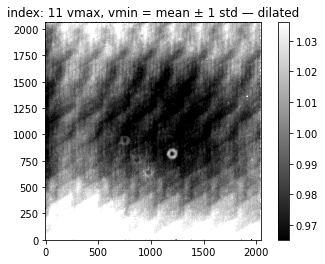

In [36]:
for g in range(0,len(mkmedimgs)):
    if g!=1:
        m, s = np.nanmean(mkmedimgs[g]), np.nanstd(mkmedimgs[g])
        plt.figure()
        img = np.asarray(mkmedimgs[g])
        img[np.isfinite(img)==0.0]=1.0
        plt.imshow(img, origin='lower', vmax=m+s, vmin=m-s, cmap='gray')
        plt.title('index: {} vmax, vmin = mean ± 1 std — dilated'.format(g))
        plt.colorbar()
# plt.savefig('/Users/avery/seoproject/mk10iter_230303.png')

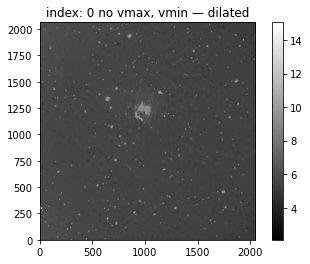

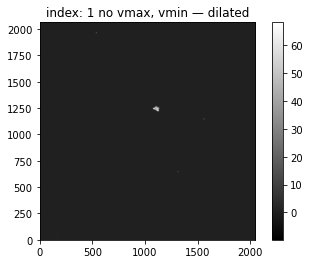

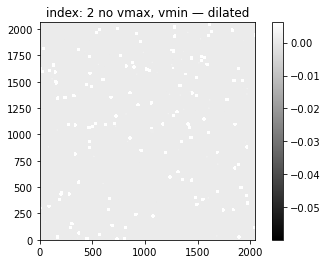

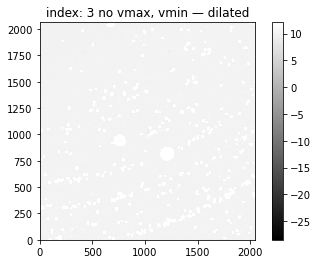

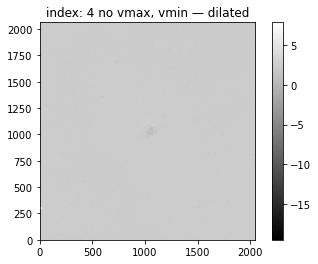

...

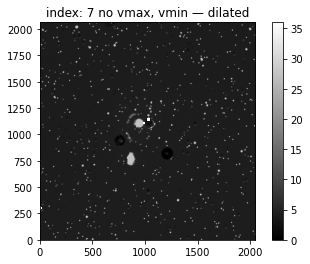

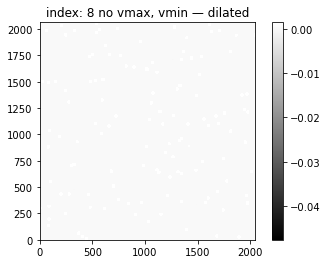

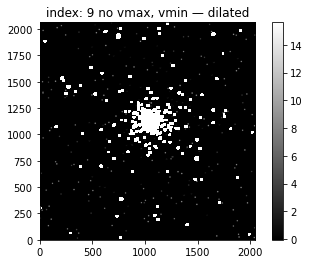

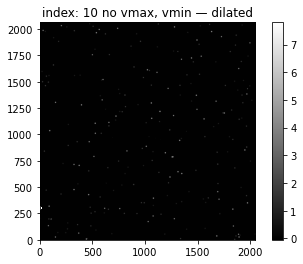

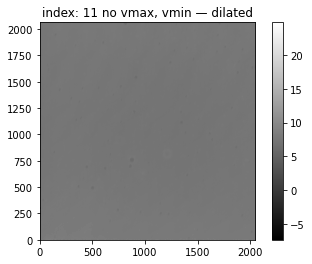

In [87]:
for g in range(0,len(mkmedimgs)):
    plt.figure()
    plt.imshow(mkmedimgs[g], origin='lower', cmap='gray')
    plt.title('index: {} no vmax, vmin — dilated'.format(g))
    plt.colorbar()
# plt.savefig('/Users/avery/seoproject/mk10iter_230303.png')

/var/folders/dn/860znfzd5g994cf8xvnckf1r0000gp/T/ipykernel_20200/829980479.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


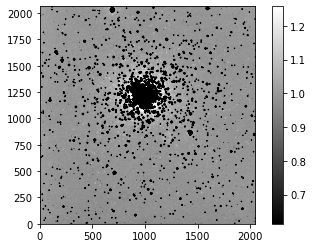

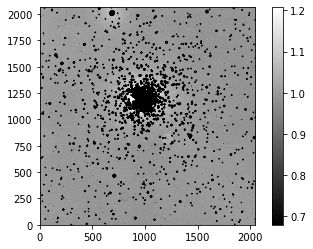

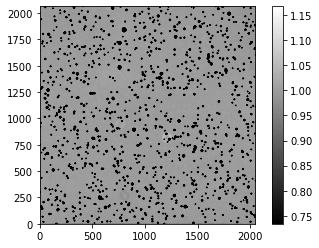

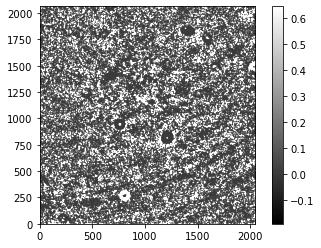

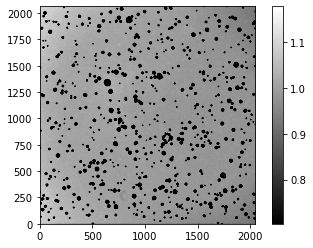

...

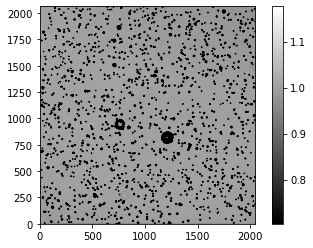

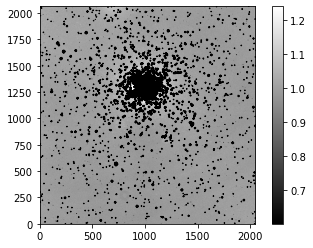

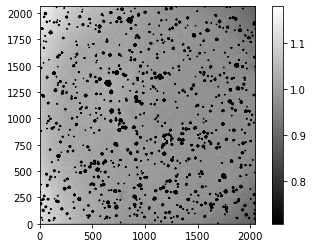

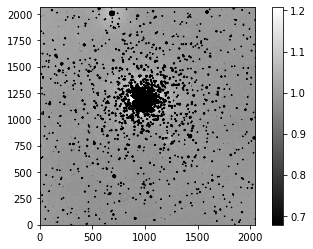

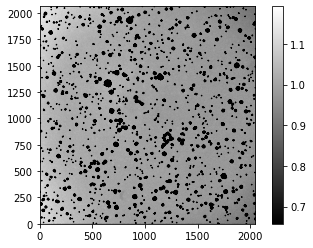

In [37]:
for i in range(0,len(nights[uq[13]])):
    night = nights[uq[0]]
#     sgm = segnights[uq[5]]
#     fig, axs = plt.subplots(1,1)
#     axs[0].suptitle('image 1std')
#     axs[1].suptitle('segmap')
    plt.figure()
    m, s = np.nanmean(night[i]), np.nanstd(night[i])
    plt.imshow(night[i], origin='lower', vmax=m+s, vmin=m-s, cmap='gray')
    plt.colorbar()
#     axs[1].imshow(sgm[i], origin='lower', cmap='gray')

In [ ]:
for i in range(0,test.shape[0]):
#     night = nights[uq[0]]
#     sgm = segnights[uq[5]]
#     fig, axs = plt.subplots(1,1)
#     axs[0].suptitle('image 1std')
#     axs[1].suptitle('segmap')
    plt.figure()
    m, s = np.nanmean(test[i]), np.nanstd(test[i])
    plt.imshow(test[i], origin='lower', vmax=m+s, vmin=m-s, cmap='gray')
    plt.colorbar()
#     axs[1].imshow(sgm[i], origin='lower', cmap='gray')

In [21]:
ign = [3,10,21]

In [24]:
test = np.delete(nights[uq[0]],ign, axis=0)

In [25]:
test.shape

(59, 2064, 2048)

In [26]:
mn, md, std = astropy.stats.sigma_clipped_stats(test, axis=0, mask_value=0.0)

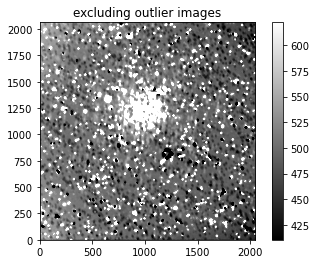

In [29]:
m, s = np.nanmean(md), np.nanstd(md)
plt.imshow(md, origin='lower', vmax=m+s, vmin=m-s, cmap='gray')
plt.title('excluding outlier images')
plt.colorbar()
# plt.savefig('/Users/avery/seoproject/mk10iter_230303.png')

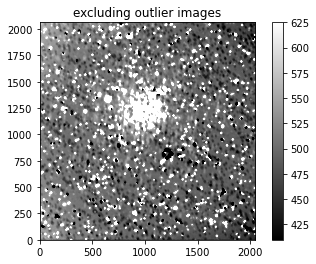

In [32]:
m, s = np.nanmean(mkmedimgs[0]), np.nanstd(mkmedimgs[0])
plt.imshow(mkmedimgs[0], origin='lower', vmax=m+s, vmin=m-s, cmap='gray')
plt.title('excluding outlier images')
plt.colorbar()
# plt.savefig('/Users/avery/seoproject/mk10iter_230303.png')

#### plotting images per filter per night

In [142]:
for f in fuq:
    print(f)

OIII
SII
clear
g-band
h-alpha
i-band
r-band


In [145]:
mkmedimgs[uq[0]]

{'g-band': array([[0.99520016, 1.02155447, 0.97489959, ..., 0.9871372 , 0.97190732,
         0.99676168],
        [1.01674819, 1.00328314, 0.96792501, ..., 0.98837197, 1.00282574,
         0.99781501],
        [0.99193245, 1.0274055 , 1.02714205, ..., 0.97632474, 1.0241133 ,
         0.99507594],
        ...,
        [1.03877455, 1.05990756, 1.0214231 , ..., 1.02760923, 0.98701108,
         1.00437236],
        [0.99830738, 0.96053514, 1.02518135, ..., 0.98282254, 1.01834059,
         0.98787355],
        [1.01399612, 1.04100817, 1.06344402, ..., 0.97531444, 1.00797307,
         0.97925508]]),
 'i-band': array([[1.02990079, 0.92992324, 0.9736768 , ..., 1.00893819, 0.88070035,
         0.95550799],
        [1.03597665, 1.0285815 , 0.97077167, ..., 0.97025764, 0.98926061,
         0.97904587],
        [0.95421088, 0.98007202, 0.94460577, ..., 0.98561931, 0.98206991,
         0.94355607],
        ...,
        [0.99005449, 1.04799926, 1.05740547, ..., 1.00423896, 1.01213753,
         1.021

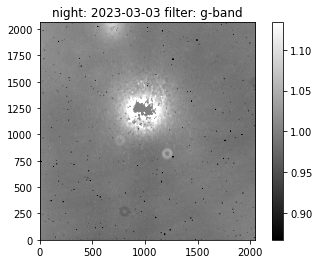

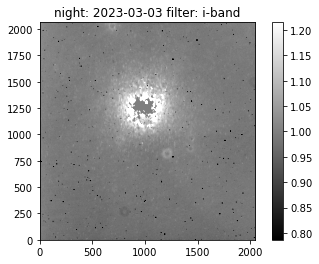

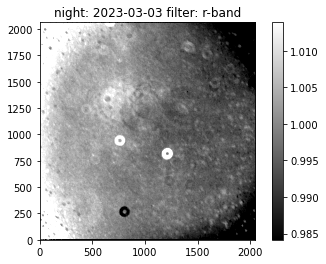

In [153]:
u=uq[0]
for f in fuq:
    if len(mkmedimgs[u][f])!=0:
        m, s = np.nanmean(mkmedimgs[u][f]), np.nanstd(mkmedimgs[u][f])
        plt.figure()
        img = np.asarray(mkmedimgs[u][f])
        img[np.isfinite(img)==0.0]=1.0
        plt.imshow(img, origin='lower', vmax=m+s, vmin=m-s, cmap='gray')
        plt.title('night: {0} filter: {1}'.format(u,f))
        plt.colorbar()


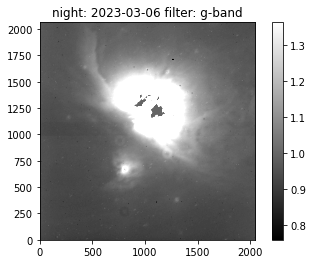

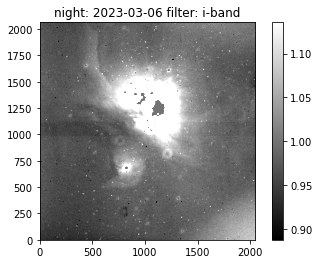

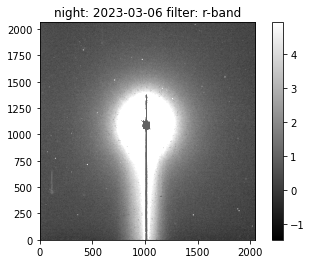

In [154]:
u=uq[1]
for f in fuq:
    if len(mkmedimgs[u][f])!=0:
        m, s = np.nanmean(mkmedimgs[u][f]), np.nanstd(mkmedimgs[u][f])
        plt.figure()
        img = np.asarray(mkmedimgs[u][f])
        img[np.isfinite(img)==0.0]=1.0
        plt.imshow(img, origin='lower', vmax=m+s, vmin=m-s, cmap='gray')
        plt.title('night: {0} filter: {1}'.format(u,f))
        plt.colorbar()


In [159]:
mkmedimgs[uq[2]]

{'OIII': [],
 'SII': [],
 'clear': [],
 'g-band': array([[1.02431548, 1.01522136, 1.0147835 , ..., 0.96994272, 1.05322593,
         1.07343799],
        [1.03646278, 1.00266922, 0.99975288, ..., 1.08037692, 1.05528116,
         1.04289567],
        [1.04100984, 1.01627386, 1.06379491, ..., 1.02088034, 1.06636369,
         0.99814537],
        ...,
        [0.98082399, 0.94024706, 0.94660407, ..., 1.03316188, 1.00439179,
         0.93525976],
        [0.9444651 , 0.94660354, 0.94776684, ..., 0.9695867 , 0.99024442,
         0.97927788],
        [0.94975698, 0.92818972, 0.96416283, ..., 0.98016059, 0.99254933,
         1.06178355]]),
 'h-alpha': [],
 'i-band': masked_array(
   data=[[--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         ...,
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --],
         [--, --, --, ..., --, --, --]],
   mask=[[ True,  True,  True, ...,  True,  True,  True],
      

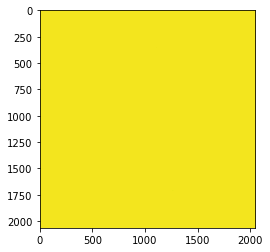

In [160]:
plt.imshow(mkmedimgs[uq[2]]['g-band'], cmap='gray')

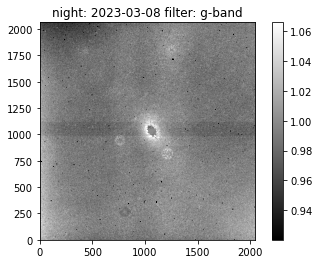

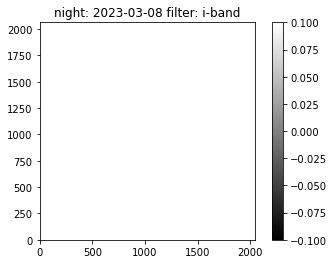

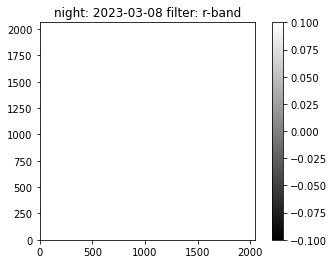

In [162]:
u=uq[2]
for f in fuq:
    if len(mkmedimgs[u][f])!=0:
        m, s = np.ma.mean(mkmedimgs[u][f]), np.ma.std(mkmedimgs[u][f])
        plt.figure()
        img = np.asarray(mkmedimgs[u][f])
        img[np.isfinite(img)==0.0]=1.0
        plt.imshow(img, origin='lower', vmax=m+s, vmin=m-s, cmap='gray')
        plt.title('night: {0} filter: {1}'.format(u,f))
        plt.colorbar()


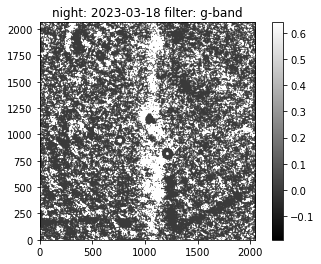

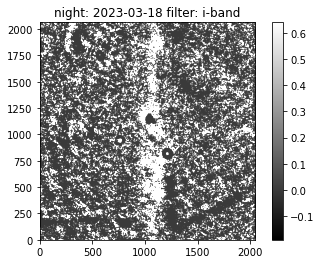

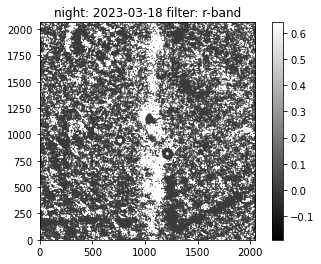

In [165]:
u=uq[3]
for f in fuq:
    if len(mkmedimgs[u][f])!=0:
        m, s = np.ma.mean(mkmedimgs[u][f][0]), np.ma.std(mkmedimgs[u][f][0])
        plt.figure()
        img = np.asarray(mkmedimgs[u][f][0])
        img[np.isfinite(img)==0.0]=1.0
        plt.imshow(img, origin='lower', vmax=m+s, vmin=m-s, cmap='gray')
        plt.title('night: {0} filter: {1}'.format(u,f))
        plt.colorbar()


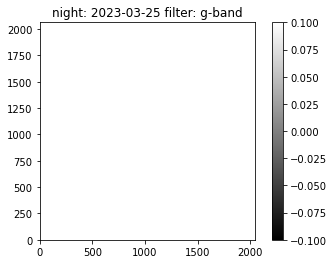

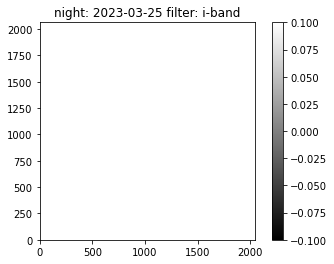

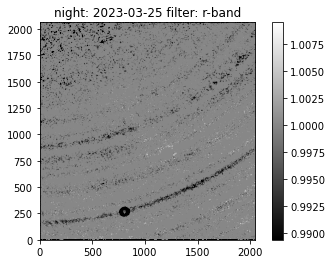

In [168]:
u=uq[4]
for f in fuq:
    if len(mkmedimgs[u][f])!=0:
        m, s = np.ma.mean(mkmedimgs[u][f]), np.ma.std(mkmedimgs[u][f])
        plt.figure()
        img = np.asarray(mkmedimgs[u][f])
        img[np.isfinite(img)==0.0]=1.0
        plt.imshow(img, origin='lower', vmax=m+s, vmin=m-s, cmap='gray')
        plt.title('night: {0} filter: {1}'.format(u,f))
        plt.colorbar()


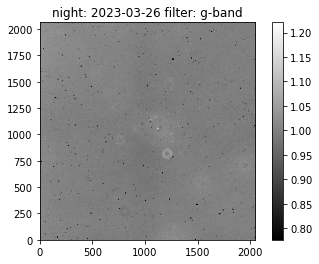

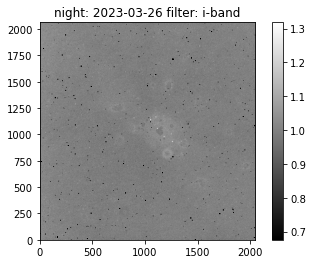

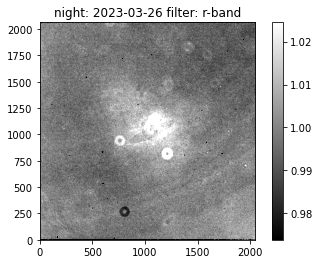

In [171]:
u=uq[5]
for f in fuq:
    if len(mkmedimgs[u][f])!=0:
        m, s = np.ma.mean(mkmedimgs[u][f]), np.ma.std(mkmedimgs[u][f])
        plt.figure()
        img = np.asarray(mkmedimgs[u][f])
        img[np.isfinite(img)==0.0]=1.0
        plt.imshow(img, origin='lower', vmax=m+s, vmin=m-s, cmap='gray')
        plt.title('night: {0} filter: {1}'.format(u,f))
        plt.colorbar()


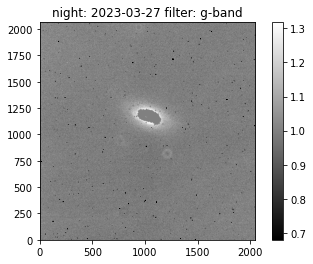

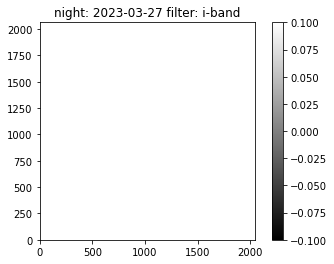

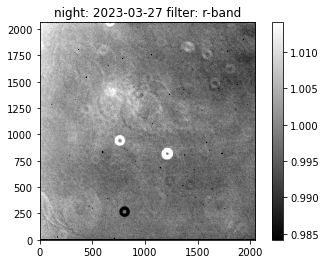

In [174]:
u=uq[6]
for f in fuq:
    if len(mkmedimgs[u][f])!=0:
        m, s = np.ma.mean(mkmedimgs[u][f]), np.ma.std(mkmedimgs[u][f])
        plt.figure()
        img = np.asarray(mkmedimgs[u][f])
        img[np.isfinite(img)==0.0]=1.0
        plt.imshow(img, origin='lower', vmax=m+s, vmin=m-s, cmap='gray')
        plt.title('night: {0} filter: {1}'.format(u,f))
        plt.colorbar()


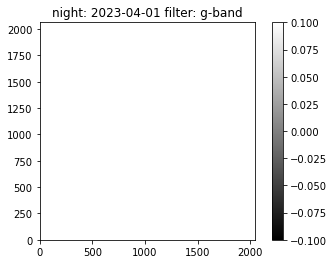

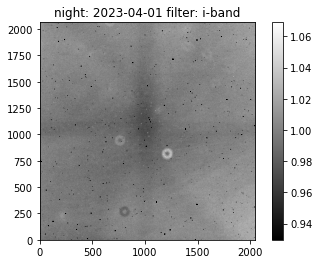

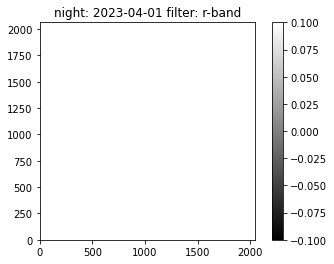

In [177]:
u=uq[7]
for f in fuq:
    if len(mkmedimgs[u][f])!=0:
        m, s = np.ma.mean(mkmedimgs[u][f]), np.ma.std(mkmedimgs[u][f])
        plt.figure()
        img = np.asarray(mkmedimgs[u][f])
        img[np.isfinite(img)==0.0]=1.0
        plt.imshow(img, origin='lower', vmax=m+s, vmin=m-s, cmap='gray')
        plt.title('night: {0} filter: {1}'.format(u,f))
        plt.colorbar()


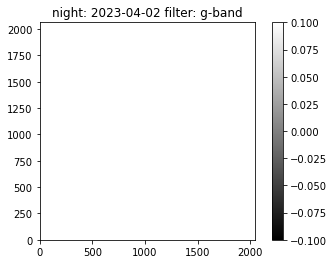

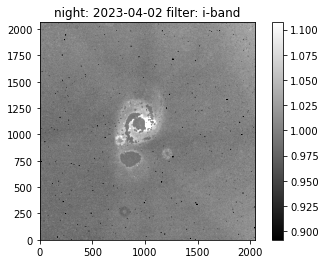

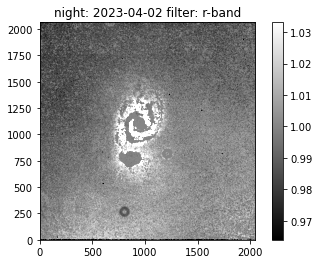

In [179]:
u=uq[8]
for f in fuq:
    if len(mkmedimgs[u][f])!=0:
        m, s = np.ma.mean(mkmedimgs[u][f]), np.ma.std(mkmedimgs[u][f])
        plt.figure()
        img = np.asarray(mkmedimgs[u][f])
        img[np.isfinite(img)==0.0]=1.0
        plt.imshow(img, origin='lower', vmax=m+s, vmin=m-s, cmap='gray')
        plt.title('night: {0} filter: {1}'.format(u,f))
        plt.colorbar()


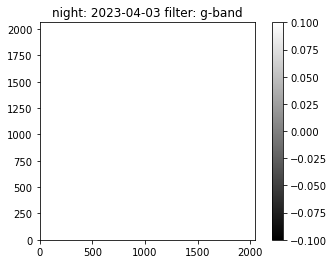

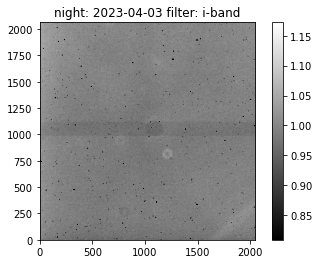

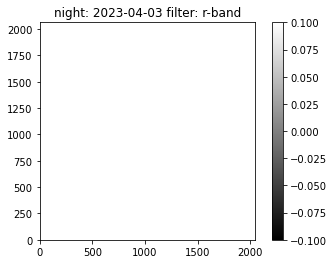

In [181]:
u=uq[9]
for f in fuq:
    if len(mkmedimgs[u][f])!=0:
        m, s = np.ma.mean(mkmedimgs[u][f]), np.ma.std(mkmedimgs[u][f])
        plt.figure()
        img = np.asarray(mkmedimgs[u][f])
        img[np.isfinite(img)==0.0]=1.0
        plt.imshow(img, origin='lower', vmax=m+s, vmin=m-s, cmap='gray')
        plt.title('night: {0} filter: {1}'.format(u,f))
        plt.colorbar()


TypeError: Invalid shape (1, 2064, 2048) for image data

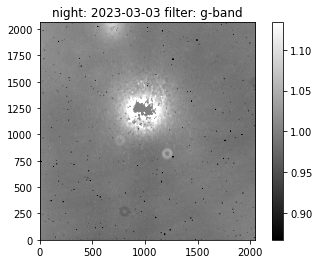

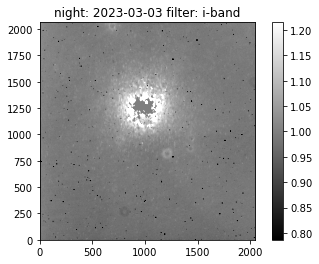

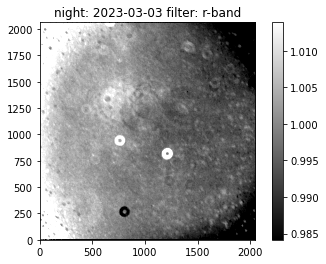

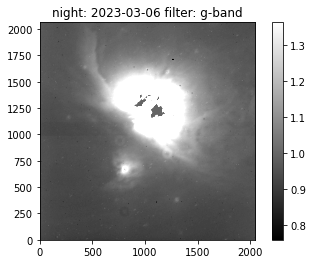

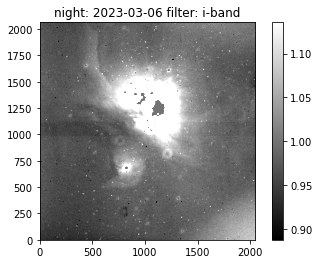

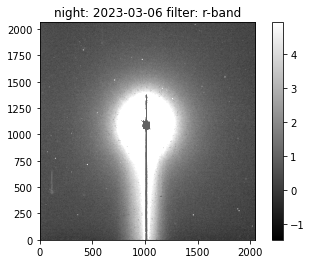

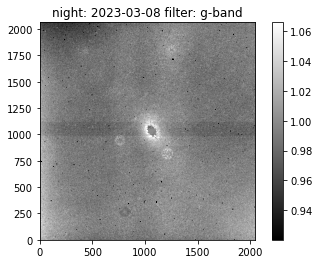

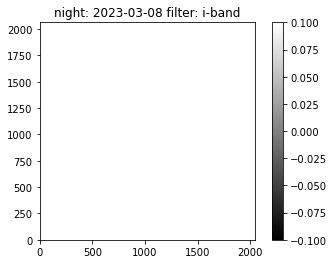

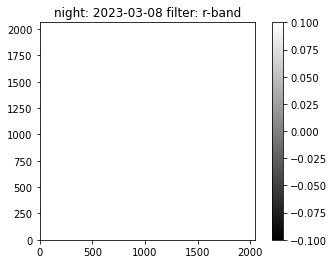

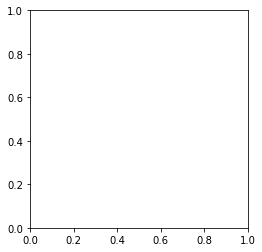

In [163]:
for u in uq:
    for f in fuq:
        if len(mkmedimgs[u][f])!=0:
            m, s = np.ma.mean(mkmedimgs[u][f]), np.ma.std(mkmedimgs[u][f])
            plt.figure()
            img = np.asarray(mkmedimgs[u][f])
            img[np.isfinite(img)==0.0]=1.0
            plt.imshow(img, origin='lower', vmax=m+s, vmin=m-s, cmap='gray')
            plt.title('night: {0} filter: {1}'.format(u,f))
            plt.colorbar()


# med per filter code included in medstack_imgs notebook

In [ ]:
%%time
mkmedimgs = {}
# mkmnimgs = {}
# mkstdimgs = {}
# iwmed = []
for i in range(0,len(uq)):
    fr = {}
    for j in range(0,len(fuq)):
#     nt = np.ma.masked_equal(nights[uq[i]],0)
#     print(nt.shape)
#     mds = np.ma.median(nt, axis=0)
        if nights[uq[i]]['all'].shape[0]>1 and nights[uq[0]][fuq[j]].shape[0]!=1:
            if nights[uq[0]][fuq[j]].shape[0]==1:
                fr[fuq[j]]=nights[uq[i]][fuq[j]]
#             iwmed.append(i)
            if nights[uq[0]][fuq[j]].shape[0]>1:
                mn, md, std = astropy.stats.sigma_clipped_stats(nights[uq[i]][fuq[j]], axis=0,mask_value=0.0)
                fr[fuq[j]]=md
#             mkmedimgs.append(md)
#             mkmnimgs.append(mn)
#             mkstdimgs.append(std)
        if nights[uq[i]]['all'].shape[0]==1 and nights[uq[0]][fuq[j]].shape[0]!=0:
#             fr[fuq[j]]=nights[uq[i]][fuq[j]]
            fr[fuq[j]]=[]
        elif nights[uq[0]][fuq[j]].shape[0]==0:
            fr[fuq[j]]=[]

    mkmedimgs[uq[i]]=fr

### plotting median background vs other parameters

In [4]:
h = fitsio.read_header(datapath+fn[0])
h


SIMPLE  =                    T / conforms to FITS standard
BITPIX  =                  -32 / array data type
NAXIS   =                    2 / number of array dimensions
NAXIS1  =                 2048 / 
NAXIS2  =                 2064 / 
EXTEND  =                    T / 
DEWTEM1 =                  -15 / dewar temperature (C)
DETECTOR= 'ProLine_PL230'      / 
GAIN    =                  0.0 / e-/ADU
DARKTIME=                   85 / time since last read (seconds)
XBIN    =                    1 / 
YBIN    =                    1 / 
PIXSIZE1=                   15 / pixel size for axis 1 (microns)
PIXSIZE2=                   15 / pixel size for axis 2 (microns)
OBSERVAT= 'StoneEdge'          / 
TELESCOP= '0.5meter'           / 
OBSLONG =             -122.504 / east longitude in degrees
OBSLAT  =              38.2887 / latitude in degrees
ELEVATIO=                   60 / elevation in meters
TELSCALE=                 51.6 / arc-seconds/mm
OBSERVER= 'ixchel'             / 
RA      = '11:17:55.876

In [19]:
h['UT'].replace(':', '')

'072715'

In [34]:
clouds = []
ambients = []
primaries = []
secondars = []
times = []

for f in fn:
    h = fitsio.read_header(datapath+f)
    clouds.append(h['CLOUD'])
    ambients.append(h['AMBIENT'])
    primaries.append(h['PRIMARY'])
    secondars.append(h['SECONDAR'])
    times.append(int(h['UT'].replace(':', '')))

what is it that i want to be plotting here? the median of the median stack versus the parameters? to do so, i would bneed to categorize by night and then maybe find the median value of those? therefore, will start with previously calculated medians per image. 

Text(0.5, 1.0, 'this plot is useless until differentiating by night')

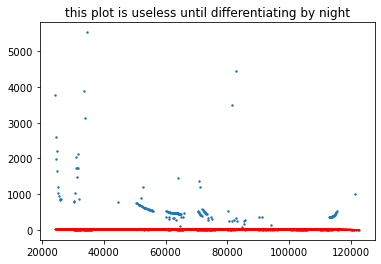

In [50]:
medsarr = np.asarray(meds)
plt.scatter(times, medsarr, label='med pix val', s=2)
plt.plot(times, ambients, label='ambient', color='red')
plt.title('this plot is useless until differentiating by night')

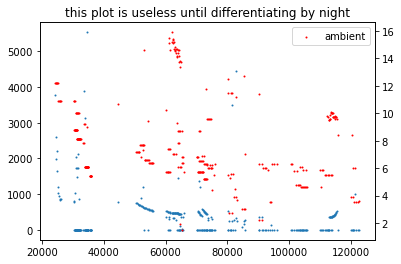

In [51]:
ax1 = plt.subplot()
ax1.scatter(times, medsarr, label='med pix val', s=1)
# ax1.ylabel('med pix val')
ax2 = ax1.twinx()
ax2.scatter(times, ambients, label='ambient', color = 'red', s=1)
# ax2.ylabel('C')
plt.xlabel('times')
plt.legend()
plt.title('this plot is useless until differentiating by night')
plt.show()

Text(0.5, 1.0, 'ambients vs med pix val')

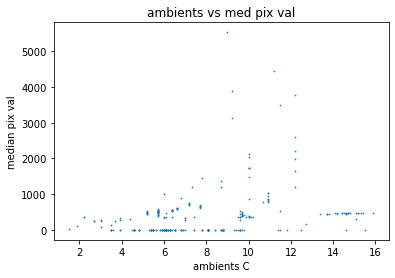

In [44]:
plt.scatter(ambients, medsarr, s=0.5)
plt.xlabel('ambients C')
plt.ylabel('median pix val')
plt.title('ambients vs med pix val')

Text(0.5, 1.0, 'primary vs med pix val')

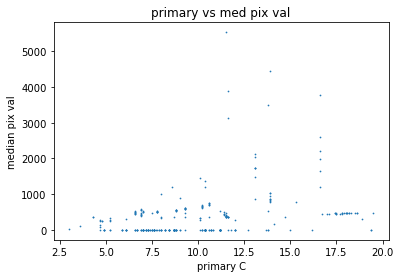

In [48]:
plt.scatter(primaries, medsarr, s=0.5)
plt.xlabel('primary C')
plt.ylabel('median pix val')
plt.title('primary vs med pix val')

Text(0.5, 1.0, 'secondar vs med pix val')

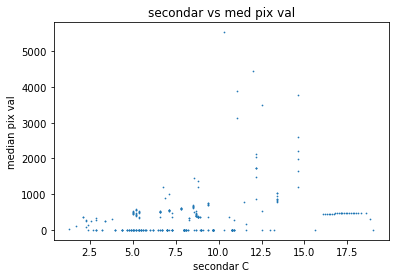

In [62]:
plt.scatter(secondars, medsarr, s=0.5)
plt.xlabel('secondar C')
plt.ylabel('median pix val')
plt.title('secondar vs med pix val')

Text(0.5, 1.0, 'clouds vs median pixel value')

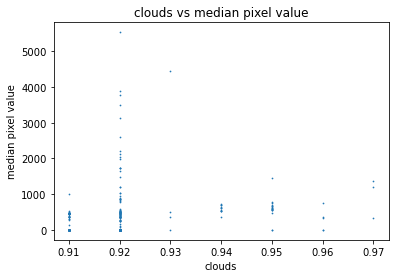

In [68]:
plt.scatter(clouds, medsarr, s=0.5)
plt.xlabel('clouds')
plt.ylabel('median pixel value')
plt.title('clouds vs median pixel value')

### plotting per night

In [58]:
clouds = np.asarray(clouds)
ambients = np.asarray(ambients)
primaries = np.asarray(primaries)
secondars = np.asarray(secondars)

featnts = {}
for i in range(0,len(uq)):
    d = uq[i]
    featnts[d]={}

for i in range(0,len(uq)):
    d = uq[i]
    ind = np.where(ix==i)[0]
#     allpn = mkimgs[ind]
    mdpn = medsarr[ind]
    clpn = clouds[ind]
    ambpn = ambients[ind]
    prpn = primaries[ind]
    sapn = secondars[ind]
#     allsgpn = segmaps[ind]
#     print(ind.shape, allpn.shape)
#     nights[d] = allpn
    featnts[d]['medpixval'] = mdpn
    featnts[d]['clouds'] = clpn
    featnts[d]['ambients'] = ambpn
    featnts[d]['primaries'] = prpn
    featnts[d]['secondars'] = sapn
#     segnights[d]=allsgpn

/var/folders/dn/860znfzd5g994cf8xvnckf1r0000gp/T/ipykernel_42201/2247428769.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


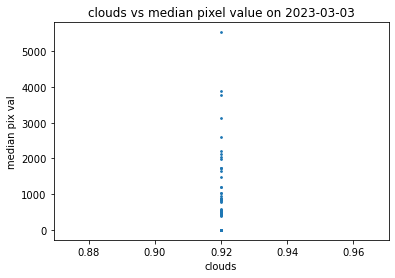

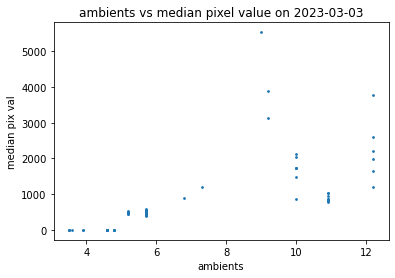

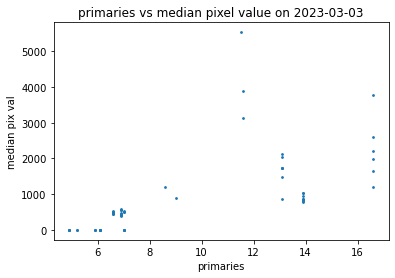

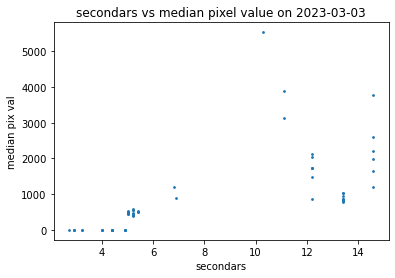

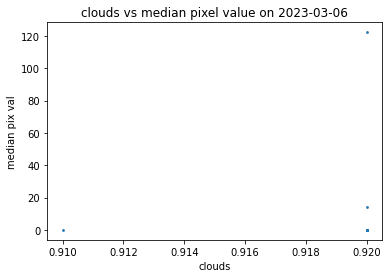

...

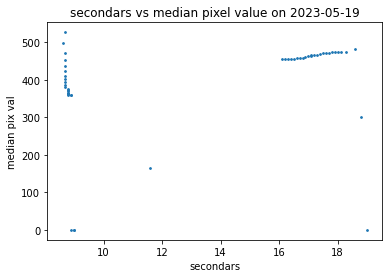

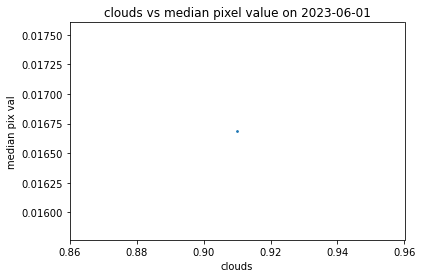

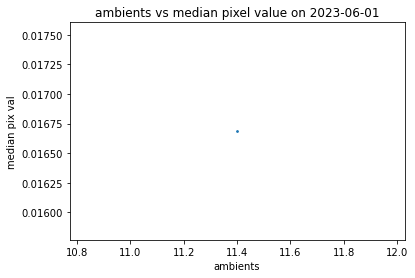

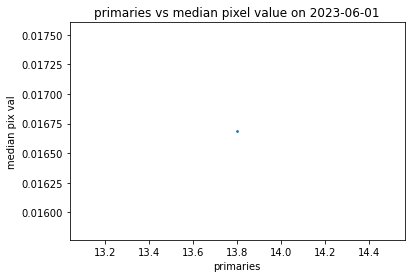

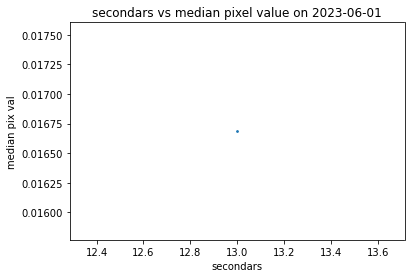

In [69]:
# plots per date

keys = ['clouds','ambients','primaries','secondars']

for dt in uq:
    for k in keys:
        plt.figure()
        plt.scatter(featnts[dt][k], featnts[dt]['medpixval'], s=3)
        plt.xlabel(k)
        plt.ylabel('median pix val')
        plt.title('{0} vs median pixel value on {1}'.format(k, dt))

In [70]:
data[segmap<1].shape

(4073154,)

In [71]:
data.flatten().shape

(4227072,)

the median pixel value is the median of ```data[segmap<1]``` found when creating all of the masked images using ```np.median()```. the thought process in finding the median of this rather than ```mkimgs```—the array of equal size to the original data with zeros where sources exist—is to avoid having to mask the zeros in the median calculation.